<a href="https://colab.research.google.com/github/whosphong/DATA-STRUCTURES-AND-PLATFORMS---UAmath509/blob/main/509_PROJ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Winter 2025 MATH 509 PROJECT

- Phong Ho
- Michael Zhang
- R.J. Bilak
- Edmond Tuong

------------------------

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import scipy.stats as stats

# EDA

In [27]:
data = 'https://raw.githubusercontent.com/whosphong/DATA-STRUCTURES-AND-PLATFORMS---UAmath509/refs/heads/main/google_review_ratings.csv'
df = pd.read_csv(data)

In [28]:
df.head(20)
df.tail(20)

df.drop(columns=['User', 'Unnamed: 25'], inplace=True)

In [18]:
## Checking types of Data

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5454 entries, 0 to 5453
Data columns (total 24 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Category 1   5454 non-null   float64
 1   Category 2   5454 non-null   float64
 2   Category 3   5454 non-null   float64
 3   Category 4   5454 non-null   float64
 4   Category 5   5454 non-null   float64
 5   Category 6   5454 non-null   float64
 6   Category 7   5454 non-null   float64
 7   Category 8   5454 non-null   float64
 8   Category 9   5454 non-null   float64
 9   Category 10  5454 non-null   float64
 10  Category 11  5454 non-null   float64
 11  Category 12  5454 non-null   float64
 12  Category 13  5454 non-null   float64
 13  Category 14  5454 non-null   float64
 14  Category 15  5454 non-null   float64
 15  Category 16  5454 non-null   float64
 16  Category 17  5454 non-null   float64
 17  Category 18  5454 non-null   float64
 18  Category 19  5454 non-null   float64
 19  Catego

In [29]:
df.describe()

,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10,...,Category 15,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24
count,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,...,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000
mean,1.455746,2.320048,2.489059,2.797103,2.958904,2.893423,3.351476,2.541177,3.126542,2.832695,...,2.206140,1.192710,0.949349,0.822525,0.969250,0.999626,0.965275,1.749345,1.531051,1.560570
std,0.827732,1.421576,1.247503,1.309188,1.338785,1.282101,1.413291,1.111398,1.356774,1.307299,...,1.715848,1.107176,0.973628,0.948015,1.202883,1.193129,0.928326,1.597816,1.316180,1.171784
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.110000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.790000,1.930000,1.620000,1.800000,1.640000,...,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.910000,2.060000,2.460000,2.670000,2.680000,3.230000,2.170000,2.800000,2.680000,...,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.687500,2.740000,4.097500,4.310000,3.837500,5.000000,3.190000,5.000000,3.527500,...,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [20]:
df = df.rename(columns = {"Category 1": "C1", "Category 2": "C2", "Category 3": "C3", "Category 4": "C4", "Category 5": "C5",
                          "Category 6": "C6", "Category 7": "C7", "Category 8": "C8", "Category 9": "C9", "Category 10": "C10",
                          "Category 11": "C11", "Category 12": "C12", "Category 13": "C13", "Category 14": "C14", "Category 15": "C15", "Category 16": "C16",
                          "Category 17": "C17", "Category 18": "C18", "Category 19": "C19", "Category 20": "C20", "Category 21": "C21", "Category 22": "C22",
                          "Category 23": "C23", "Category 24": "C24"}).copy()

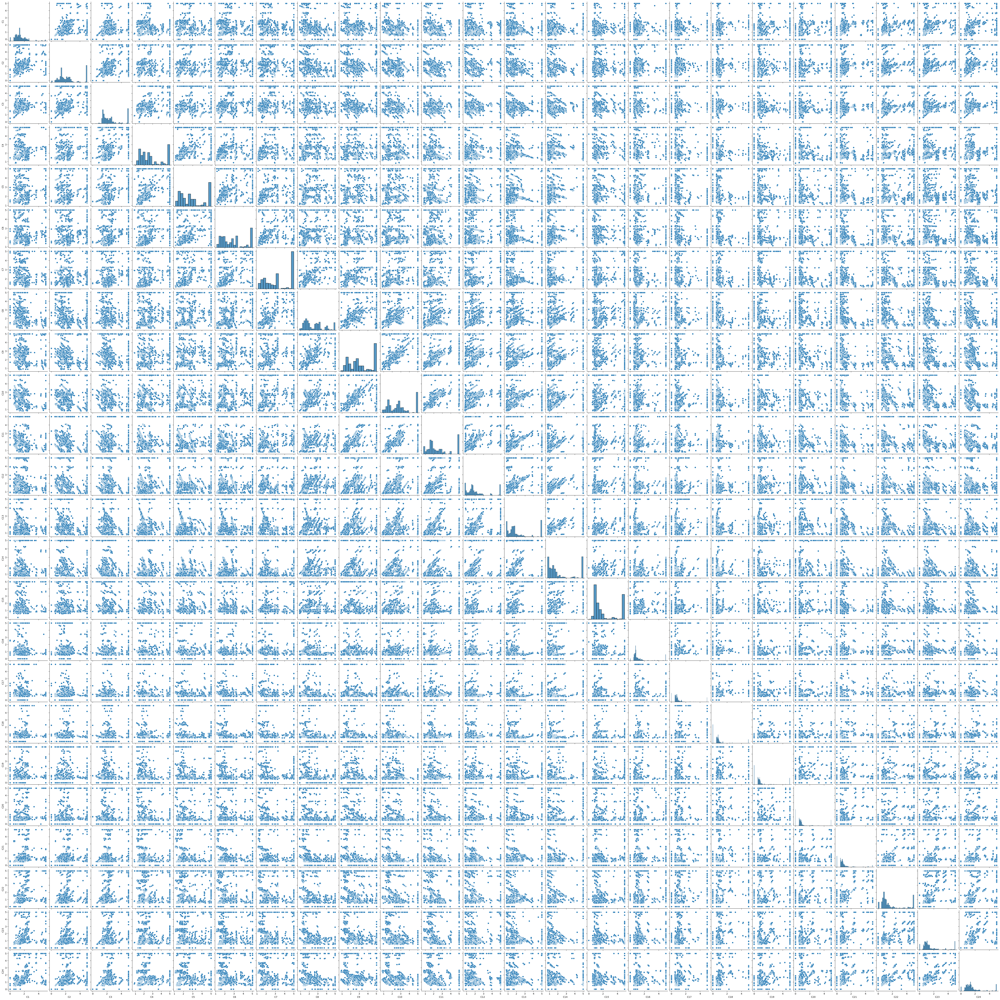

In [21]:
sns.pairplot(df)

In [22]:
df.isna().sum() ## None

dup_df = df[df.duplicated(keep=False)] ## Indicates 2 == 4, 670 == 674, 1338 == 1346
dup_df

# How unlikely is this actually? The data is all in rational numbers so it is not impossible for 2 different people to get exactly the same result.

#df.iloc[[4,674,1346],:] ## Does not show any duplicates

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,...,C15,C16,C17,C18,C19,C20,C21,C22,C23,C24
2,0.00,0.0,3.63,3.63,5.00,2.92,5.00,2.64,2.33,2.64,...,1.74,0.59,0.5,0.0,0.50,0.0,0.0,0.00,0.00,0.00
4,0.00,0.0,3.63,3.63,5.00,2.92,5.00,2.64,2.33,2.64,...,1.74,0.59,0.5,0.0,0.50,0.0,0.0,0.00,0.00,0.00
670,0.00,0.0,1.45,1.43,1.42,1.43,1.48,1.48,2.72,2.73,...,5.00,0.81,0.8,5.0,0.92,0.0,0.0,0.00,0.00,0.00
674,0.00,0.0,1.45,1.43,1.42,1.43,1.48,1.48,2.72,2.73,...,5.00,0.81,0.8,5.0,0.92,0.0,0.0,0.00,0.00,0.00
1338,1.06,1.1,5.00,3.28,5.00,5.00,5.00,1.84,1.81,5.00,...,1.77,1.80,0.0,0.0,0.00,0.0,0.0,1.05,1.03,1.04
1346,1.06,1.1,5.00,3.28,5.00,5.00,5.00,1.84,1.81,5.00,...,1.77,1.80,0.0,0.0,0.00,0.0,0.0,1.05,1.03,1.04


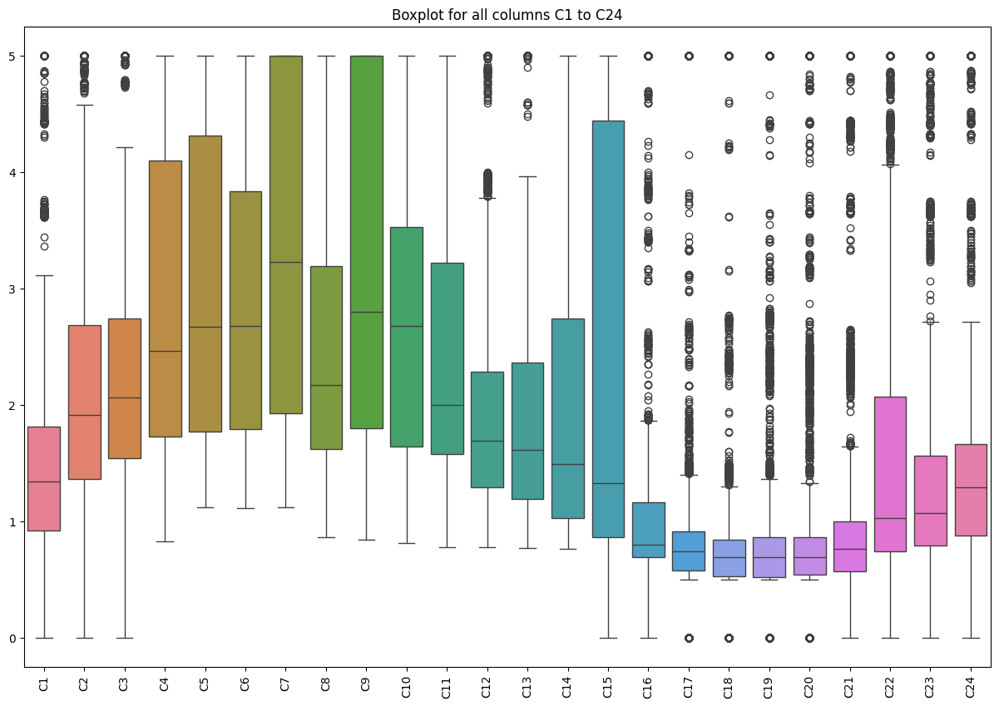

In [23]:
plt.figure(figsize=(15, 10))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.title('Boxplot for all columns C1 to C24')
plt.show()

In [30]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

#df = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)] ## Removing Outliers

Category 1     0.8900
Category 2     1.3275
Category 3     1.2000
Category 4     2.3675
Category 5     2.5400
Category 6     2.0475
Category 7     3.0700
Category 8     1.5700
Category 9     3.2000
Category 10    1.8875
Category 11    1.6375
Category 12    0.9975
Category 13    1.1700
Category 14    1.7100
Category 15    3.5800
Category 16    0.4700
Category 17    0.3300
Category 18    0.3100
Category 19    0.3400
Category 20    0.3200
Category 21    0.4300
Category 22    1.3300
Category 23    0.7700
Category 24    0.7800
dtype: float64


<Axes: >

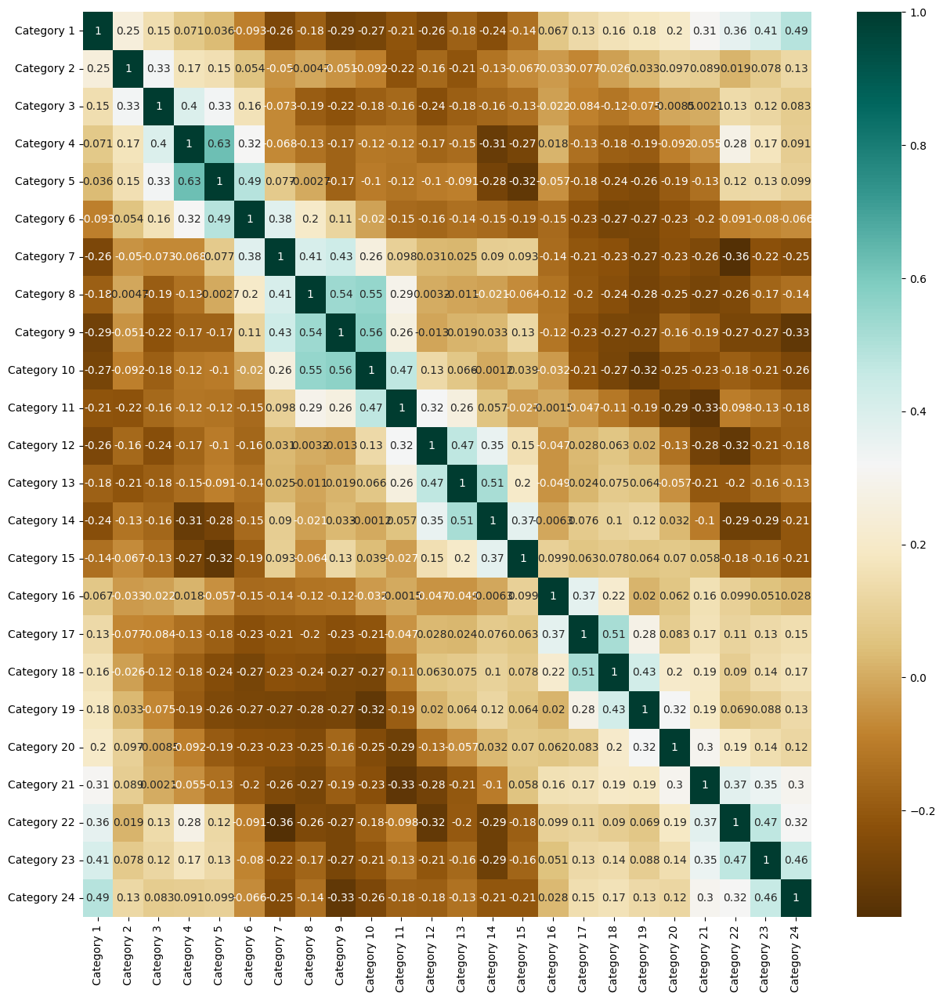

In [31]:
plt.figure(figsize=(15,15))
c= df.corr()
sns.heatmap(c,cmap="BrBG",annot=True)

In [51]:
c[c==1] = 0
maxcorrs = pd.DataFrame()
maxcorrs["Max Correlation"] = np.max(abs(c), axis=0)
maxcorrs["With"] = np.argmax(abs(c), axis=0)+1
maxcorrs

# Correlations seem not high enough to justify removing any

,Max Correlation,With
Category 1,0.489249,24
Category 2,0.325429,3
Category 3,0.396694,4
Category 4,0.626787,5
Category 5,0.626787,4
Category 6,0.489528,5
Category 7,0.432183,9
Category 8,0.551613,10
Category 9,0.564442,10
Category 10,0.564442,9
